**자동차 번호판을 인식하는 인공지능**

In [1]:
import keras_ocr
import os
import pytesseract
import cv2

import matplotlib.pyplot as plt

from PIL import Image

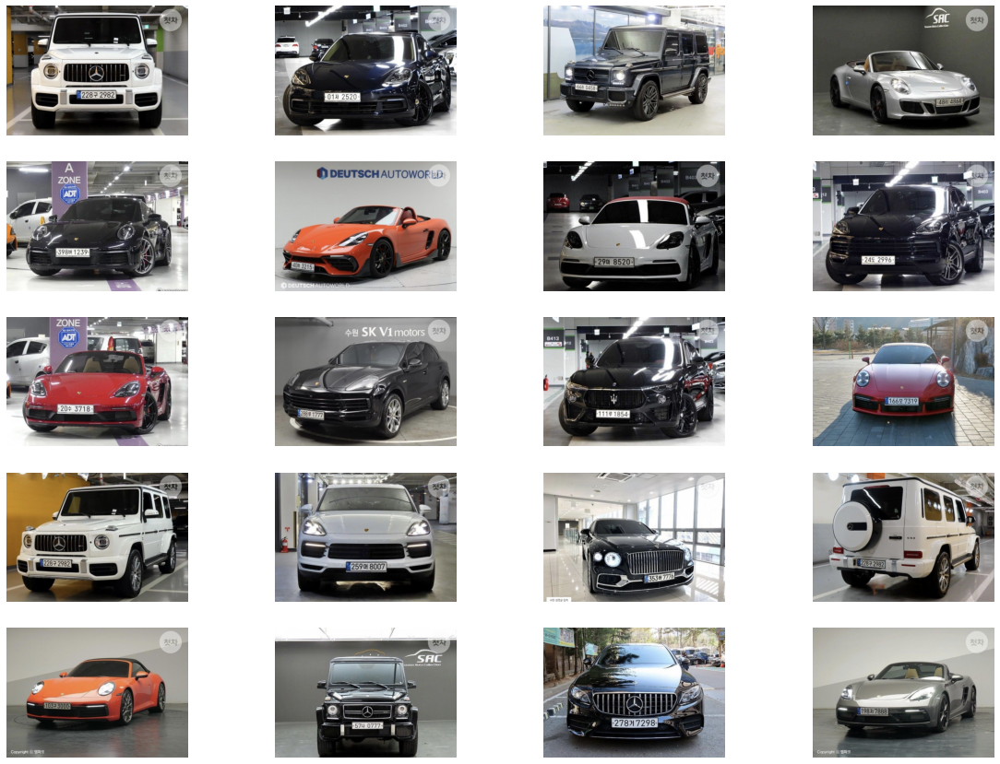

In [2]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/car'

plt.figure(figsize = (20, 15))
for i in range(20):
    img_file_path = work_dir + f'/{i}.png'
    plt.subplot(5, 4, i + 1)
    plt.imshow(cv2.cvtColor(cv2.imread(img_file_path), cv2.COLOR_BGR2RGB))
    plt.axis('off')

plt.show()

---

**Keras OCR**

In [3]:
pipeline = keras_ocr.pipeline.Pipeline()

urls = [f'./{i}.png' for i in range(20)]
imgs = [keras_ocr.tools.read(url) for url in urls]
pred = [pipeline.recognize([url]) for url in urls]

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


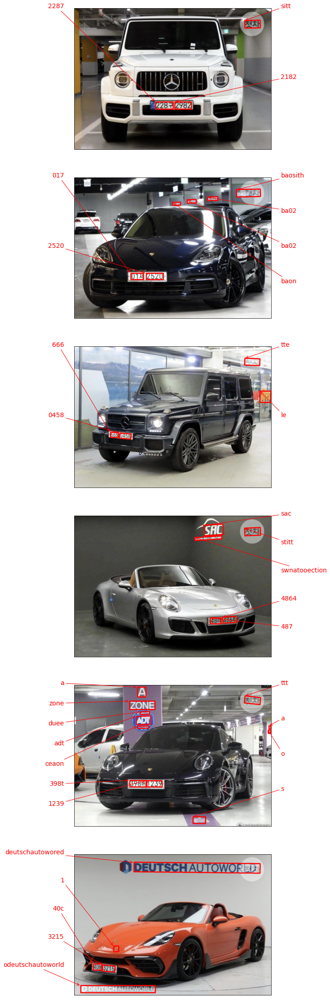

In [4]:
fig, ax = plt.subplots(nrows = 6, figsize = (20, 40))

for i, a in enumerate(ax):
    keras_ocr.tools.drawAnnotations(image = imgs[i], predictions = pred[i][0], ax = a)

---

**Tesseract OCR**

In [5]:
def crop_word_regions(image_path = './0.png', output_path = './output', index = 0):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
        
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)
    recognized_data = pytesseract.image_to_data(image, lang = 'kor', 
                                                config = custom_oem_psm_config, output_type = pytesseract.Output.DICT)
    
    top_level = max(recognized_data['level'])
    index = index
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
        
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            if width > 0 and height > 0:
                output_img_path = os.path.join(output_path, f'output{str(index).zfill(4)}.png')
                cropped_image = image.crop((left, top, left + width, top + height))
                cropped_image.save(output_img_path)
                cropped_image_path_list.append(output_img_path)
                index += 1
            
    return cropped_image_path_list

In [6]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    result = []
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(image, lang = 'kor',
                                                      config = custom_oem_psm_config, output_type = pytesseract.Output.DICT)
        result.append(recognized_data['text'])
        
    print(' '.join(result))
    print('----------------------------------------------')

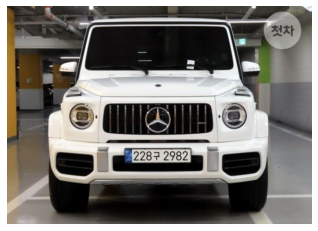

0.
 …-………매~
 7
   0.
 .
 그
 이
 2
 ”…
 다
 0

----------------------------------------------


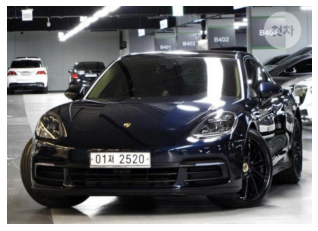


----------------------------------------------


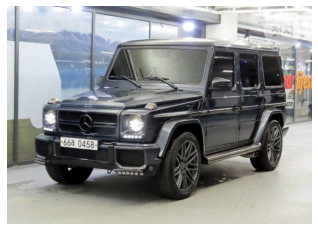

 
----------------------------------------------


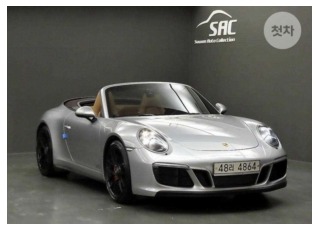

대 .

----------------------------------------------


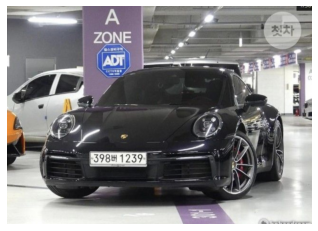


----------------------------------------------


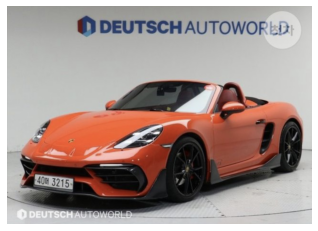

0)
 1)
 재
 0 756버 /
 Ｌ
 10100\0[
 「
 
----------------------------------------------


In [7]:
for i in range(6):
    img_file_path = work_dir + f'/{i}.png'
    
    plt.imshow(cv2.cvtColor(cv2.imread(img_file_path), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    
    cropped_image_path_list = crop_word_regions(img_file_path, work_dir, i)
    recognize_images(cropped_image_path_list)

---

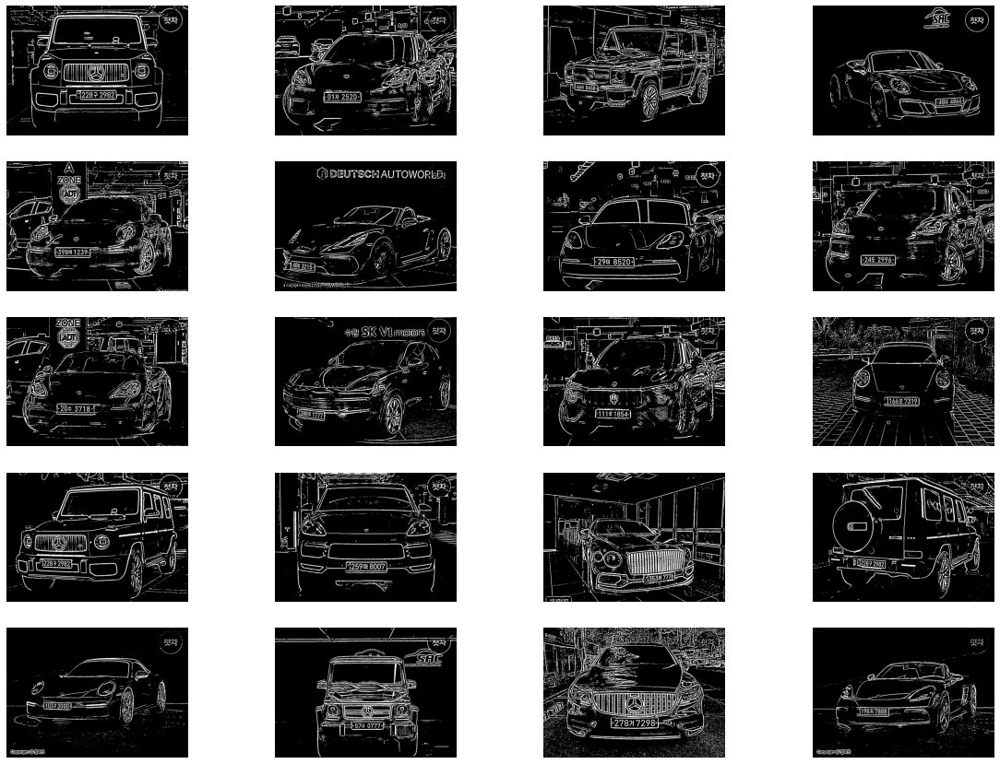

In [8]:
## 이미지 전처리

plt.figure(figsize = (20, 15))
for i in range(20):
    original = cv2.imread(work_dir + f'/{i}.png')
    gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY) # 흑백
    
    # threshold
    struct = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, struct)
    tophat = cv2.add(gray, tophat)
    blackHat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, struct)
    gray = cv2.subtract(tophat, blackHat)
    
    gaussian = cv2.GaussianBlur(gray, ksize=(5, 5), sigmaX=0) # gaussian blur

    thresh = cv2.adaptiveThreshold(gaussian, maxValue=255.0, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                   thresholdType=cv2.THRESH_BINARY_INV, blockSize=19, C=9)
    
    cv2.imwrite(work_dir + f'/edge{i}.png', thresh)
    
    plt.subplot(5, 4, i + 1)
    plt.imshow(thresh, cmap = 'gray')
    plt.axis('off')
    
plt.show()

* 이미지를 더 잘 인식할 수 있도록 흑백으로 변환 후 윤곽선을 남깁니다.

---

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


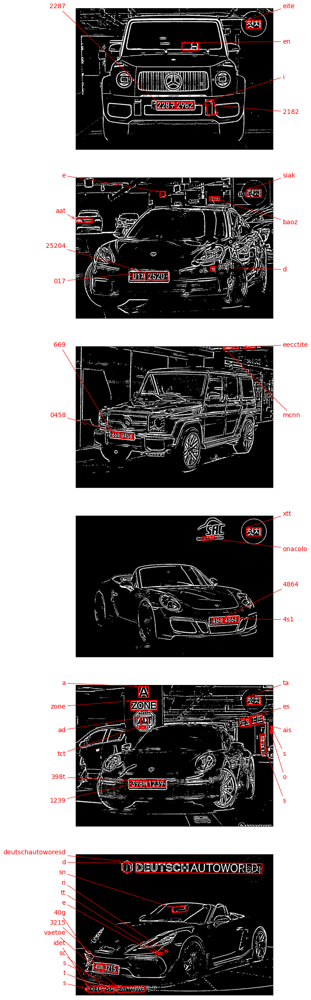

In [9]:
## Keras OCR

pipeline = keras_ocr.pipeline.Pipeline()

urls = [f'./edge{i}.png' for i in range(20)]
imgs = [keras_ocr.tools.read(url) for url in urls]
pred = [pipeline.recognize([url]) for url in urls]

fig, ax = plt.subplots(nrows = 6, figsize = (20, 40))

for i, a in enumerate(ax):
    keras_ocr.tools.drawAnnotations(image = imgs[i], predictions = pred[i][0], ax = a)

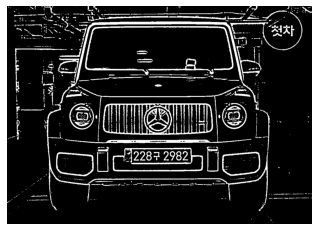


----------------------------------------------


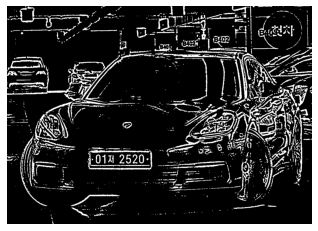


----------------------------------------------


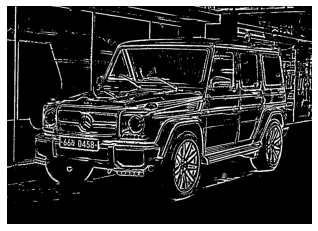


----------------------------------------------


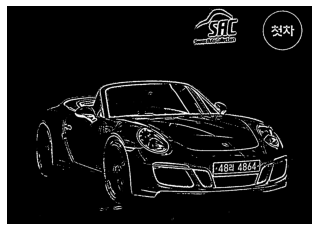


----------------------------------------------


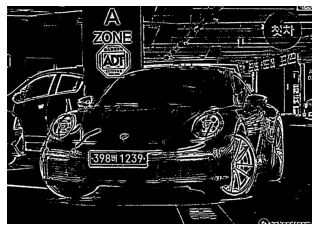


----------------------------------------------


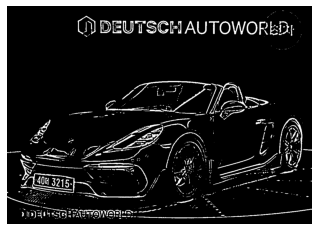

00065
 허먼
 「셔
 ”
 「
 /()ㅁ
 !
     ： ~ 덜 ~”     "                 버
 때
 스이
 ㆍ
 이
 7
 . ~”
 삐
 .
 [버운
 16
 보노
 1
 대
 자
 내건
 복니
  01,
 6
 더
 1소
 시
 0 오
 0 ＊

----------------------------------------------


In [10]:
## Tesseract OCR

for i in range(6):
    img_file_path = work_dir + f'/edge{i}.png'
    
    plt.imshow(cv2.cvtColor(cv2.imread(img_file_path), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    
    cropped_image_path_list = crop_word_regions(img_file_path, work_dir, i)
    recognize_images(cropped_image_path_list)

---

**결과**

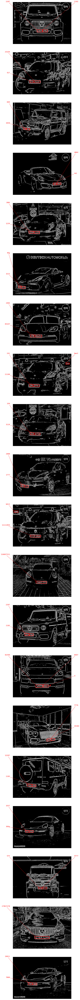

In [12]:
fig, ax = plt.subplots(nrows = 20, figsize = (20, 160))

for i, a in enumerate(ax):
    new_pred = []
    for elem in pred[i][0]:
        if any(word.isdigit() for word in elem[0]):
            new_pred.append(elem)
        
    keras_ocr.tools.drawAnnotations(image = imgs[i], predictions = new_pred, ax = a)

---

**회고**

* 이미지를 처리하기 전과 후 모두 Tesseract OCR은 성능이 매우 안 좋았습니다. (번호판을 전혀 인식하지 못함)
* 이미지를 처리하기 전과 후 모두 Keras OCR은 성능이 좋았습니다. 이미지를 처리한 후 성능이 소폭 향상되었습니다.

* 다만, keras OCR은 한국어 패치가 되어 있지 않으므로 번호판의 번호는 읽을 수 없습니다.

* 따라서, 이 모델은 자동차에서 번호판이 어디 위치하는 지 알아내는 데 활용할 수 있습니다.
* 서비스 예시 <br/>
    중고차 어플에서 개인정보 보호를 위해 거래 자동차 사진에서 자동차 번호판을 가려야 하는 경우 번호를 인식하여 자동으로 모자이크 처리하는 서비스를 개발할 수 있습니다.

* 혹은 알파벳으로만 이루어진 해외 자동차에 사용하거나 Keras OCR에 한국어 학습을 추가로 진행하여 완전히 자동차 번호판의 번호를 읽을 수 있도록 발전시킬 수 있습니다.

* 평가 기준

|항목|Keras OCR|Tesseract OCR|
|:------:|:---:|:---:|
|자동차 번호판의 위치를 인식하는가|O|X|
|자동차 번호판을 읽을 수 있는가|△ (숫자와 알파벳을 어느정도 읽을 수 있음)|X|
|속도가 빠르고 서비스에 적용하기 용이한가|O|△ (결과가 없었기에 아직 미지수)|

* 이미지 출처: 중고차 어플 '첫차'